In [90]:
import pandas as pd 
import numpy as np 
import re 

In [91]:
pd.set_option("display.max_colwidth", None) 
pd.set_option("display.max_rows", None) 
pd.set_option("display.max_columns", None)

In [92]:
df = pd.read_csv("flats_house_cleaned_phase2.csv")

temp_df = df.copy()

In [93]:
temp_df.sample(1)

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features
2747,flat,sare homes,sector 92,1.12,5358.0,2090.0,Carpet area: 2090 (194.17 sq.m.),4,4,2,servant room,12.0,North-West,1 to 5 Year Old,"['Yadav Clinic', 'Bangali Clinic', 'Dr. J. S. Sarkar Clinic', 'Sagar Clinic', 'Vijay Petrol Pump', 'HP Petrol Pump', 'Essar Petrol Pump', 'Indian Oil']",NaN,"['Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'No open drainage around', 'Piped-gas', 'Visitor Parking', 'Swimming Pool', 'Park', 'Shopping Centre', 'Fitness Centre / GYM', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant']"


## Feature Engineering 

### 1. areaWithType Column 

In [94]:
temp_df[["price", "area", "areaWithType"]].sample(5)

,price,area,areaWithType
2589,4.75,2340.0,Plot area 260(217.39 sq.m.)
3039,0.27,458.0,Carpet area: 457.81 (42.53 sq.m.)
2122,NaN,NaN,Built Up area: 7331 (681.07 sq.m.)
1316,8.45,359.0,Plot area 359(33.35 sq.m.)
2092,NaN,NaN,Plot area 250(209.03 sq.m.)Built Up area: 260 sq.yards (217.39 sq.m.)Carpet area: 245 sq.yards (204.85 sq.m.)


In [95]:
# extract the super built up area 
# temp_df["areaWithType"].head()
def extract_super_built_up_area(text):
    match = re.search(r'Super Built up area (\d+\.?\d*)', text)
    if match:
        return float(match.group(1))
    
    return None

In [96]:
# extract the carpet area or built up area 
def extract_area(text, area_type):
    match = re.search(area_type + r"\s*:\s*(\d+\.?\d*)", text) 
    if match:
        return float(match.group(1)) 
    return None 

In [97]:
# scale down the data to same scale (sqft)
def convert_to_sqft(text, area_value):
    if area_value is None:
        return None 
    
    match = re.search(r'{} \((\d+\.?\d*) sq.m.\)'.format(area_value), text) 
    if match:
        square_me = float(match.group(1)) 
        return square_me * 10.7639  # conversion factor from sq.m. to sqft
    return area_value

In [98]:
# get the super built up area 
temp_df["super_built_up_area"] = temp_df["areaWithType"].apply(extract_super_built_up_area)

In [99]:
# now convert the super built up area to sqft 
temp_df["super_built_up_area"] = temp_df.apply(lambda x: convert_to_sqft(x["areaWithType"], x["super_built_up_area"]), axis=1)

In [100]:
# extract the built up area 
# temp_df["built_up_area"] = temp_df["areaWithType"].apply(lambda x: extract_area(x, "Built Up area"))
temp_df["super_built_up_area"].dtype

dtype('float64')

In [101]:
# convert the built up area to sqft 
# temp_df.apply(lambda x: convert_to_sqft(x["areaWithType"], x["built_up_area"]), axis=1)
# temp_df.apply(lambda x: convert_to_sqft(x['areaWithType'], x['built_up_area']), axis=1)
temp_df['built_up_area'] = temp_df['areaWithType'].apply(lambda x: extract_area(x, 'Built Up area'))
temp_df['built_up_area'] = temp_df.apply(lambda x: convert_to_sqft(x['areaWithType'], x['built_up_area']), axis=1)

In [102]:
temp_df["carpet_area"] = temp_df["areaWithType"].apply(lambda x: extract_area(x, "Carpet area"))

In [103]:
temp_df["carpet_area"] = temp_df.apply(lambda x: convert_to_sqft(x["areaWithType"], x["carpet_area"]), axis=1)

In [104]:
temp_df[["super_built_up_area", "built_up_area", "carpet_area"]]

,super_built_up_area,built_up_area,carpet_area
0,1875.00,NaN,NaN
1,1930.00,1929.000000,1928.000000
2,2143.00,NaN,NaN
3,NaN,NaN,540.000000
4,NaN,NaN,1298.000000
5,NaN,30.000000,15.000000
6,1400.00,1300.000000,1200.000000
7,2575.00,NaN,NaN
8,1640.00,NaN,NaN
9,2201.00,2200.000000,1800.000000


In [105]:
temp_df["built_up_area"].dtype

dtype('float64')

In [106]:
temp_df["carpet_area"].dtype

dtype('float64')

In [107]:
# check for duplicated values 
temp_df.duplicated().sum()

122

In [108]:
# check for rows where all the values are present (super_built_up_area, built_up_area, carpet_area)
sample = temp_df[~((temp_df["super_built_up_area"].isnull()) | (temp_df["built_up_area"].isnull()) | (temp_df["carpet_area"].isnull()))][["price", "area", "super_built_up_area", "built_up_area", "carpet_area"]] 

In [109]:
sample.shape

(534, 5)

In [110]:
# get the rows where areaType is Plot Area 
temp_df[["areaWithType", "price", "area", "super_built_up_area", "built_up_area", "carpet_area"]][temp_df["areaWithType"].str.contains("Plot")].shape

(684, 6)

In [111]:
# check for null values 
temp_df.isnull().sum()

property_type             0
society                   1
sector                    0
price                    18
price_per_sqft           18
area                     18
areaWithType              0
bedRoom                   0
bathroom                  0
balcony                   0
additionalRoom            0
floorNum                 19
facing                 1105
agePossession             1
nearbyLocations         177
furnishDetails          981
features                635
super_built_up_area    1890
built_up_area          2618
carpet_area            1861
dtype: int64

In [112]:
# check for rows where all the values are missing for super_built_up_area, built_up_area, carpet_area columns 
all_nan_df = temp_df[["price", "area", "areaWithType", "super_built_up_area", "built_up_area", "carpet_area"]][(temp_df["super_built_up_area"].isnull()) & temp_df["built_up_area"].isnull() & temp_df["carpet_area"].isnull()]

In [113]:
# storing the index of this rows (this will help in future for further work)
all_nan_index = temp_df[["price", "areaWithType", "area", "super_built_up_area", "built_up_area", "carpet_area"]][(temp_df["super_built_up_area"].isnull()) & temp_df["built_up_area"].isnull() & temp_df["carpet_area"].isnull()].index

In [114]:
all_nan_index

Int64Index([  16,   17,   21,   23,   37,   38,   45,   60,   62,   63,
            ...
            3749, 3750, 3751, 3753, 3755, 3759, 3762, 3783, 3786, 3798],
           dtype='int64', length=548)

In [115]:
# function to extract plot area from the areaWithType column 
# temp_df[["price", "areaWithType", "super_built_up_area", "built_up_area", "carpet_area"]][temp_df["areaWithType"].str.contains("Plot")]

def extract_plot_area(text):
    match = re.search(r"Plot area (\d+\.?\d*)", text)
    if match:
        return match.group(1)
    return None 

In [116]:
all_nan_df["built_up_area"] = all_nan_df["areaWithType"].apply(extract_plot_area)

In [117]:
all_nan_df

,price,area,areaWithType,super_built_up_area,built_up_area,carpet_area
16,7.85,2700.0,Plot area 300(250.84 sq.m.),NaN,300,NaN
17,0.40,432.0,Plot area 432(40.13 sq.m.),NaN,432,NaN
21,5.60,4000.0,Plot area 4000(371.61 sq.m.),NaN,4000,NaN
23,0.40,900.0,Plot area 900(83.61 sq.m.),NaN,900,NaN
37,6.50,2500.0,Plot area 2500(232.26 sq.m.),NaN,2500,NaN
38,11.58,3240.0,Plot area 360(301.01 sq.m.),NaN,360,NaN
45,11.29,3240.0,Plot area 360(301.01 sq.m.),NaN,360,NaN
60,5.25,1935.0,Plot area 215(179.77 sq.m.),NaN,215,NaN
62,0.92,603.0,Plot area 67(56.02 sq.m.),NaN,67,NaN
63,10.55,3240.0,Plot area 360(301.01 sq.m.),NaN,360,NaN


In [118]:
# you can update the original dataframe 
temp_df[["price", "area", "areaWithType", "super_built_up_area", "built_up_area", "carpet_area"]][temp_df["areaWithType"].str.contains("Plot")]

,price,area,areaWithType,super_built_up_area,built_up_area,carpet_area
3,0.35,540.0,Plot area 600(55.74 sq.m.)Carpet area: 540 sq.ft. (50.17 sq.m.),NaN,NaN,540.0
5,0.60,50.0,Plot area 50(4.65 sq.m.)Built Up area: 30 sq.ft. (2.79 sq.m.)Carpet area: 15 sq.ft. (1.39 sq.m.),NaN,30.0,15.0
16,7.85,2700.0,Plot area 300(250.84 sq.m.),NaN,NaN,NaN
17,0.40,432.0,Plot area 432(40.13 sq.m.),NaN,NaN,NaN
21,5.60,4000.0,Plot area 4000(371.61 sq.m.),NaN,NaN,NaN
23,0.40,900.0,Plot area 900(83.61 sq.m.),NaN,NaN,NaN
26,6.80,2160.0,Plot area 240(200.67 sq.m.)Built Up area: 220 sq.yards (183.95 sq.m.)Carpet area: 200 sq.yards (167.23 sq.m.),NaN,220.0,200.0
28,5.75,3500.0,Plot area 272(25.27 sq.m.)Built Up area: 4800 sq.ft. (445.93 sq.m.)Carpet area: 3500 sq.ft. (325.16 sq.m.),NaN,4800.0,3500.0
37,6.50,2500.0,Plot area 2500(232.26 sq.m.),NaN,NaN,NaN
38,11.58,3240.0,Plot area 360(301.01 sq.m.),NaN,NaN,NaN


In [119]:
# now check for null values (now the null values in built_up_area column are less as compared to previous one)
temp_df.isnull().sum()

property_type             0
society                   1
sector                    0
price                    18
price_per_sqft           18
area                     18
areaWithType              0
bedRoom                   0
bathroom                  0
balcony                   0
additionalRoom            0
floorNum                 19
facing                 1105
agePossession             1
nearbyLocations         177
furnishDetails          981
features                635
super_built_up_area    1890
built_up_area          2618
carpet_area            1861
dtype: int64

### 2. additionalRoom

In [120]:
temp_df["additionalRoom"]

0                                        servant room
1                             pooja room,servant room
2                                        servant room
3                                       not available
4                                          pooja room
5                                              others
6                                          store room
7                             study room,servant room
8                                          pooja room
9                                          study room
10                                       servant room
11                                       servant room
12                                         study room
13                                      not available
14                              pooja room,study room
15                            pooja room,servant room
16          pooja room,study room,servant room,others
17                                      not available
18                     pooja

In [121]:
# extracting the information and creating new columns 
new_cols = ["study room", "servant room", "store room", "pooja room", "others"]
for col in new_cols:
    temp_df[col] = temp_df["additionalRoom"].str.contains(col).astype(int)

In [122]:
temp_df[["additionalRoom", "study room", "store room", "servant room", "pooja room", "others"]]

,additionalRoom,study room,store room,servant room,pooja room,others
0,servant room,0,0,1,0,0
1,"pooja room,servant room",0,0,1,1,0
2,servant room,0,0,1,0,0
3,not available,0,0,0,0,0
4,pooja room,0,0,0,1,0
5,others,0,0,0,0,1
6,store room,0,1,0,0,0
7,"study room,servant room",1,0,1,0,0
8,pooja room,0,0,0,1,0
9,study room,1,0,0,0,0


### 3. agePossession

In [123]:
temp_df["agePossession"].value_counts() 

1 to 5 Year Old       1676
5 to 10 Year Old       576
0 to 1 Year Old        531
undefined              332
10+ Year Old           310
Under Construction      90
Within 6 months         70
Within 3 months         26
Dec-23                  20
By 2023                 19
By 2024                 17
Dec-24                  15
Mar-24                  14
Aug-23                   7
Dec-25                   7
Jan-24                   7
Oct-24                   7
Jun-24                   5
Nov-23                   5
Aug-24                   4
Sep-23                   4
Jul-24                   4
By 2025                  4
Jan-25                   3
Oct-23                   3
Nov-24                   3
May-24                   3
Feb-24                   3
Jun-27                   2
Jul-27                   2
Sep-25                   2
Jun 2024                 2
Aug-25                   2
Dec-26                   2
Jan-26                   2
Oct-25                   2
Jul-25                   2
M

In [124]:
def categorize_age_possession(value):
    if pd.isna(value):
        return "Undefined"
    if "0 to 1 Year Old" in value or "Within 6 months" in value or "Within 3 months" in value:
        return "New Property"
    if "1 to 5 Year Old" in value:
        return "Relatively New" 
    if "5 to 10 Year Old" in value:
        return "Moderately Old"
    if "10+ Year Old" in value:
        return "Old Property" 
    if "Under Construction" in value or "By" in value:
        return "Under Construction"
    try:
        # For entries like 'May 2024'
        int(value.split(" ")[-1])
        return "Under Construction"
    except:
        return "Undefined"

In [125]:
temp_df["agePossession"] = temp_df["agePossession"].apply(categorize_age_possession)

In [126]:
temp_df["agePossession"].value_counts()

Relatively New        1676
New Property           627
Moderately Old         576
Undefined              476
Old Property           310
Under Construction     140
Name: agePossession, dtype: int64

### 4. furnishDetails

In [127]:
temp_df[["property_type", "furnishDetails", "features"]]

,property_type,furnishDetails,features
0,flat,NaN,"['Security / Fire Alarm', 'Power Back-up', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'Water Storage', 'Separate entry for servant room', 'Swimming Pool', 'Park', 'Natural Light', 'Airy Rooms', 'Spacious Interiors', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']"
1,flat,"['3 Wardrobe', '6 Fan', '1 Exhaust Fan', '3 Geyser', '20 Light', '1 Chimney', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Curtains', 'No Dining Table', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Washing Machine', 'No Water Purifier']","['Security / Fire Alarm', 'Power Back-up', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'Separate entry for servant room', 'No open drainage around', 'Piped-gas', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Spacious Interiors', 'Low Density Society', 'Shopping Centre', 'Fitness Centre / GYM', 'Waste Disposal', 'Rain Water Harvesting', 'Club house / Community Center', 'Water softening plant']"
2,flat,NaN,"['Security / Fire Alarm', 'Lift(s)', 'Maintenance Staff', 'Swimming Pool', 'Water Storage', 'Park', 'Visitor Parking', 'Fitness Centre / GYM', 'Club house / Community Center', 'Rain Water Harvesting']"
3,house,NaN,NaN
4,flat,NaN,"['Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Piped-gas', 'Visitor Parking', 'Swimming Pool', 'Park', 'Internet/wi-fi connectivity', 'Shopping Centre', 'Fitness Centre / GYM', 'Waste Disposal', 'Rain Water Harvesting']"
5,house,NaN,NaN
6,flat,NaN,"['Water purifier', 'Centrally Air Conditioned', 'Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Private Garden / Terrace', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Bank Attached Property', 'Piped-gas', 'Internet/wi-fi connectivity', 'Recently Renovated', 'Visitor Parking', 'Swimming Pool', 'Park', 'Natural Light', 'Airy Rooms', 'Spacious Interiors', 'Low Density Society', 'Waste Disposal', 'Rain Water Harvesting', 'Fitness Centre / GYM', 'Club house / Community Center']"
7,flat,NaN,"['Centrally Air Conditioned', 'Water purifier', 'Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Private Garden / Terrace', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Bank Attached Property', 'Piped-gas', 'Internet/wi-fi connectivity', 'Recently Renovated', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Low Density Society', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']"
8,flat,NaN,"['Feng Shui / Vaastu Compliant', 'Security / Fire Alarm', 'Intercom Facility', 'Lift(s)', 'Maintenance Staff', 'Water Storage', 'Park', 'Visitor Parking']"
9,flat,"['1 Exhaust Fan', 'No AC', 'No Bed', 'No Chimney', 'No Curtains', 'No Dining Table', 'No Fan', 'No Geyser', 'No Modular Kitchen', 'No Light', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Wardrobe', 'No Washing Machine', 'No Water Purifier']","['Power Back-up', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Piped-gas', 'Swimming Pool', 'Park', 'Security Personnel', 'Internet/wi-fi connectivity', 'Shopping Centre', 'Fitness Centre / GYM', 'Waste Disposal', 'Club house / Community Center', 'Water softening plant']"


In [128]:
# Extract all unique funrnishing items from the furnishDetails column 
all_furnishing_items = []
for item in temp_df["furnishDetails"].dropna():
    furnishing_item = item.replace('[', '').replace(']', '').replace("'", '').split(', ')
    all_furnishing_items.extend(furnishing_item)

unique_furnishing_items = list(set(all_furnishing_items))

In [129]:
# function to get the count of each furninshing item 
def get_count_of_furnishing_item(details, furnishing):
    if isinstance(details, str):
        if f"No {furnishing}" in details:
            return 0
        pattern = re.compile(f"(\d+) {furnishing}")
        match = pattern.search(details)
        if match:
            return int(match.group(1))
        elif furnishing in details:
            return 1
    return 0

In [130]:
# Simplify the furnishings list by removing "No" prefix and numbers
columns_to_include = [re.sub(r'No |\d+', '', furnishing).strip() for furnishing in unique_furnishing_items]
columns_to_include = list(set(columns_to_include))  # Get unique furnishings
columns_to_include = [furnishing for furnishing in columns_to_include if furnishing]  # Remove empty strings

# Create new columns for each unique furnishing and populate with counts
for furnishing in columns_to_include:
    temp_df[furnishing] = temp_df['furnishDetails'].apply(lambda x: get_count_of_furnishing_item(x, furnishing))

# Create the new dataframe with the required columns
furnishings_df = temp_df[['furnishDetails'] + columns_to_include]

In [131]:
furnishings_df.shape

(3805, 19)

In [132]:
furnishings_df.drop(columns=["furnishDetails"], inplace=True)

C:\Users\Omkar\AppData\Local\Temp\ipykernel_8456\924765855.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  furnishings_df.drop(columns=["furnishDetails"], inplace=True)


In [133]:
furnishings_df[["Bed", "Light"]]

furnishings_df.sample(5)

,Stove,Fan,Microwave,Fridge,Geyser,Water Purifier,Light,TV,Modular Kitchen,Curtains,AC,Bed,Chimney,Wardrobe,Washing Machine,Dining Table,Exhaust Fan,Sofa
1282,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1412,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
833,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
705,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
169,1,10,1,1,7,1,14,7,1,1,0,7,1,7,1,1,1,1


In [134]:
items = ["Exhaust Fan", "Light", "Chimney, Sofa", "AC", "Fan", "Fridge", "Dining Table", "Water Purifier", "Modular Kitchen"
"Stove", "Washing Machine", "Geyser", "Microwave", "Bed", "WardrobeTV", "Curtains"]

In [135]:
len(items)

15

In [136]:
# for item in items:
#     if item in furnishings_df.columns:
#         print(item)

In [137]:
# applying kmeans clustering 
import matplotlib.pyplot as plt 
from sklearn.cluster import KMeans 
from sklearn.preprocessing import StandardScaler 

In [138]:
scalar = StandardScaler()
scaled_data = scalar.fit_transform(furnishings_df)

In [139]:
wcss_reduced = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init="k-means++", random_state=42)
    kmeans.fit(scaled_data)
    wcss_reduced.append(kmeans.inertia_)

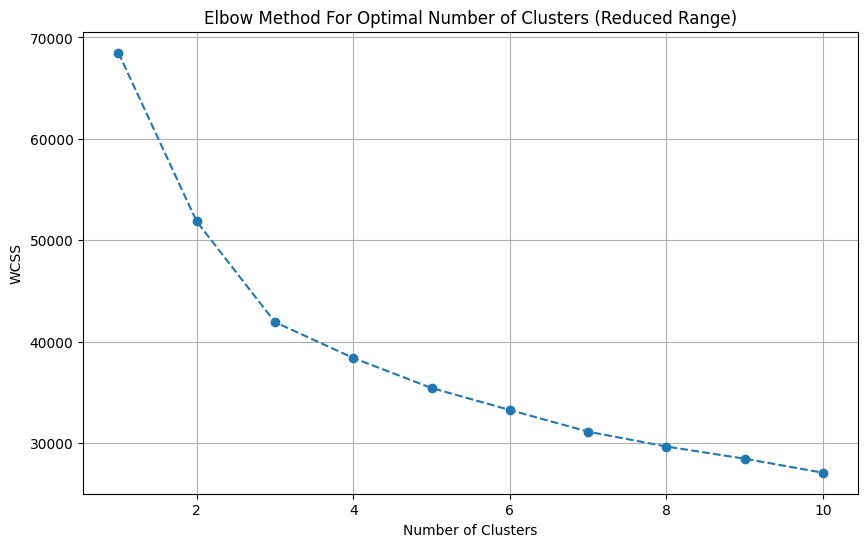

In [140]:
# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(range(1,11), wcss_reduced, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal Number of Clusters (Reduced Range)')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

In [141]:
n_clusters = 3

# Fit the KMeans model
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(scaled_data)

# Predict the cluster assignments for each row
cluster_assignments = kmeans.predict(scaled_data)

In [142]:
temp_df = temp_df.iloc[:, :-18]

In [143]:
temp_df["furnishing_type"] = cluster_assignments

* ####  0 -> unfurnished
* #### 1 -> semifurnished
* #### 2 -> furnished

In [144]:
temp_df["furnishing_type"].value_counts()

1    2513
0    1077
2     215
Name: furnishing_type, dtype: int64

### 5. features 

In [145]:
temp_df[["property_type", "furnishDetails", "features", "furnishing_type"]].sample(5)

,property_type,furnishDetails,features,furnishing_type
2361,flat,NaN,"['Private Garden / Terrace', 'Lift(s)', 'Maintenance Staff', 'No open drainage around', 'Bank Attached Property', 'Piped-gas', 'Swimming Pool', 'Park', 'Natural Light', 'Airy Rooms', 'Spacious Interiors', 'Shopping Centre', 'Fitness Centre / GYM', 'Waste Disposal', 'Rain Water Harvesting', 'Club house / Community Center']",1
3129,flat,"['6 Fan', '5 Light', '2 AC', 'No Bed', 'No Chimney', 'No Curtains', 'No Dining Table', 'No Exhaust Fan', 'No Geyser', 'No Modular Kitchen', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Wardrobe', 'No Washing Machine', 'No Water Purifier']","['Power Back-up', 'Intercom Facility', 'Lift(s)', 'Swimming Pool', 'Maintenance Staff', 'Park', 'Piped-gas', 'Security Personnel', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center', 'Rain Water Harvesting']",1
1720,flat,"['6 Wardrobe', '1 Stove', '4 AC', '1 Modular Kitchen', '1 Chimney', 'No Bed', 'No Curtains', 'No Dining Table', 'No Exhaust Fan', 'No Fan', 'No Geyser', 'No Light', 'No Microwave', 'No Fridge', 'No Sofa', 'No TV', 'No Washing Machine', 'No Water Purifier']","['Centrally Air Conditioned', 'Water purifier', 'Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Private Garden / Terrace', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'Water Storage', 'No open drainage around', 'Piped-gas', 'Internet/wi-fi connectivity', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Spacious Interiors', 'Low Density Society', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']",0
463,house,"['8 Wardrobe', '11 Fan', '1 Exhaust Fan', '18 Light', '1 Chimney', '1 Modular Kitchen', 'No AC', 'No Bed', 'No Curtains', 'No Dining Table', 'No Geyser', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Washing Machine', 'No Water Purifier']","['Feng Shui / Vaastu Compliant', 'Private Garden / Terrace', 'High Ceiling Height', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Piped-gas', 'Park', 'Natural Light', 'Spacious Interiors', 'Fitness Centre / GYM', 'Waste Disposal', 'Club house / Community Center']",0
152,flat,NaN,"['Feng Shui / Vaastu Compliant', 'Security / Fire Alarm', 'Intercom Facility', 'Lift(s)', 'Maintenance Staff', 'Water Storage', 'Park', 'Visitor Parking']",1


In [146]:
# check for null values 
temp_df["features"].isnull().sum()

635

In [147]:
# importing the appartment wala dataset
app_df = pd.read_csv("Datasets/appartments.csv")
app_df.head()

,PropertyName,PropertySubName,NearbyLocations,LocationAdvantages,Link,PriceDetails,TopFacilities
0,Smartworld One DXP,"2, 3, 4 BHK Apartment in Sector 113, Gurgaon","['Bajghera Road', 'Palam Vihar Halt', 'DPSG Palam Vihar', 'Park Hospital', 'Gurgaon Railway Station']","{'Bajghera Road': '800 Meter', 'Palam Vihar Halt': '2.5 KM', 'DPSG Palam Vihar': '3.1 KM', 'Park Hospital': '3.1 KM', 'Gurgaon Railway Station': '4.9 KM', 'The NorthCap University': '5.4 KM', 'Dwarka Expy': '1.2 KM', 'Hyatt Place Gurgaon Udyog Vihar': '7.7 KM', 'Dwarka Sector 21, Metro Station': '7.2 KM', 'Pacific D21 Mall': '7.4 KM', 'Indira Gandhi International Airport': '14.7 KM', 'Hamoni Golf Camp': '6.2 KM', 'Fun N Food Waterpark': '8.8 KM', 'Accenture DDC5': '9 KM'}",https://www.99acres.com/smartworld-one-dxp-sector-113-gurgaon-npxid-r400415,"{'2 BHK': {'building_type': 'Apartment', 'area_type': 'Carpet Area', 'area': '1,370 sq.ft.', 'price-range': '₹ 2 - 2.4 Cr'}, '3 BHK': {'building_type': 'Apartment', 'area_type': 'Carpet Area', 'area': '1,850 - 2,050 sq.ft.', 'price-range': '₹ 2.25 - 3.59 Cr'}, '4 BHK': {'building_type': 'Apartment', 'area_type': 'Carpet Area', 'area': '2,600 sq.ft.', 'price-range': '₹ 3.24 - 4.56 Cr'}}","['Swimming Pool', 'Salon', 'Restaurant', 'Spa', 'Cafeteria', 'Sun Deck', '24x7 Security', 'Club House', 'Gated Community']"
1,M3M Crown,"3, 4 BHK Apartment in Sector 111, Gurgaon","['DPSG Palam Vihar Gurugram', 'The NorthCap University', 'Park Hospital, Palam Vihar', 'Pacific D21 Mall', 'Palam Vihar Halt Railway Station']","{'DPSG Palam Vihar Gurugram': '1.4 Km', 'The NorthCap University': '4.4 Km', 'Park Hospital, Palam Vihar': '1.4 Km', 'Pacific D21 Mall': '8.2 Km', 'Palam Vihar Halt Railway Station': '1.2 Km', 'Dwarka Sector 21 Metro Station': '8.1 Km', 'Dwarka Expressway': '450 m', 'Fun N Food Water Park': '8.1 Km', 'Indira Gandhi International Airport': '14.1 Km', 'Tau DeviLal Sports Complex': '11.2 Km', 'Hamoni Golf Camp': '5 Km', 'Hyatt Place': '6.1 Km', 'Altrade Business Centre': '11.2 Km'}",https://www.99acres.com/m3m-crown-sector-111-gurgaon-npxid-r404068,"{'3 BHK': {'building_type': 'Apartment', 'area_type': 'Super Built-up Area', 'area': '1,605 - 2,170 sq.ft.', 'price-range': '₹ 2.2 - 3.03 Cr'}, '4 BHK': {'building_type': 'Apartment', 'area_type': 'Super Built-up Area', 'area': '2,248 - 2,670 sq.ft.', 'price-range': '₹ 3.08 - 3.73 Cr'}}","['Bowling Alley', 'Mini Theatre', 'Manicured Garden', 'Swimming Pool', 'Flower Garden', 'Reading Lounge', 'Golf Course', 'Barbecue', 'Sauna']"
2,Adani Brahma Samsara Vilasa,"Land, 3, 4 BHK Independent Floor in Sector 63, Gurgaon","['AIPL Business Club Sector 62', 'Heritage Xperiential Learning School', 'CK Birla Hospital', 'Paras Trinity Mall Sector 63', 'Rapid Metro Station Sector 56']","{'AIPL Business Club Sector 62': '2.7 Km', 'Heritage Xperiential Learning School': '2 Km', 'CK Birla Hospital': '2.5 Km', 'Paras Trinity Mall Sector 63': '3.5 Km', 'Rapid Metro Station Sector 56': '3.8 Km', 'De Adventure Park': '6.8 Km', 'Golf Course Ext Rd': '99 Meter', 'DoubleTree by Hilton Hotel Gurgaon': '3.6 Km', 'KIIT College of Engineering Sohna Road': '8.4 Km', 'Mehrauli-Gurgaon Road': '11.8 Km', 'Indira Gandhi International Airport': '21.1 Km', 'Nirvana Rd': '160 Meter', 'TERI Golf Course': '8.7 Km'}",https://www.99acres.com/adani-brahma-samsara-vilasa-sector-63-gurgaon-npxid-r327995,"{'3 BHK': {'building_type': 'Independent Floor', 'area_type': 'Super Built-up Area', 'area': '1,800 - 3,150 sq.ft.', 'price-range': '₹ 2.43 - 15.75 Cr'}, '4 BHK': {'building_type': 'Independent Floor', 'area_type': 'Super Built-up Area', 'area': '2,750 - 4,500 sq.ft.', 'price-range': '₹ 3.36 - 22.5 Cr'}, 'Land': {'building_type': '', 'area_type': 'Plot Area', 'area': '500 - 4,329 sq.ft.', 'price-range': '₹ 2.05 - 41.13 Cr'}}","['Terrace Garden', 'Gazebo', 'Fountain', 'Amphitheatre', 'Party Lawn', 'Basketball Court', 'Badminton Court', 'Yoga/Meditation Area', 'Indoor Games']"
3,Sobha City,"2, 3, 4 BHK Apartment in S

In [148]:
app_df["PropertyName"] = app_df['PropertyName'].str.lower()

In [149]:
app_df.head()

,PropertyName,PropertySubName,NearbyLocations,LocationAdvantages,Link,PriceDetails,TopFacilities
0,smartworld one dxp,"2, 3, 4 BHK Apartment in Sector 113, Gurgaon","['Bajghera Road', 'Palam Vihar Halt', 'DPSG Palam Vihar', 'Park Hospital', 'Gurgaon Railway Station']","{'Bajghera Road': '800 Meter', 'Palam Vihar Halt': '2.5 KM', 'DPSG Palam Vihar': '3.1 KM', 'Park Hospital': '3.1 KM', 'Gurgaon Railway Station': '4.9 KM', 'The NorthCap University': '5.4 KM', 'Dwarka Expy': '1.2 KM', 'Hyatt Place Gurgaon Udyog Vihar': '7.7 KM', 'Dwarka Sector 21, Metro Station': '7.2 KM', 'Pacific D21 Mall': '7.4 KM', 'Indira Gandhi International Airport': '14.7 KM', 'Hamoni Golf Camp': '6.2 KM', 'Fun N Food Waterpark': '8.8 KM', 'Accenture DDC5': '9 KM'}",https://www.99acres.com/smartworld-one-dxp-sector-113-gurgaon-npxid-r400415,"{'2 BHK': {'building_type': 'Apartment', 'area_type': 'Carpet Area', 'area': '1,370 sq.ft.', 'price-range': '₹ 2 - 2.4 Cr'}, '3 BHK': {'building_type': 'Apartment', 'area_type': 'Carpet Area', 'area': '1,850 - 2,050 sq.ft.', 'price-range': '₹ 2.25 - 3.59 Cr'}, '4 BHK': {'building_type': 'Apartment', 'area_type': 'Carpet Area', 'area': '2,600 sq.ft.', 'price-range': '₹ 3.24 - 4.56 Cr'}}","['Swimming Pool', 'Salon', 'Restaurant', 'Spa', 'Cafeteria', 'Sun Deck', '24x7 Security', 'Club House', 'Gated Community']"
1,m3m crown,"3, 4 BHK Apartment in Sector 111, Gurgaon","['DPSG Palam Vihar Gurugram', 'The NorthCap University', 'Park Hospital, Palam Vihar', 'Pacific D21 Mall', 'Palam Vihar Halt Railway Station']","{'DPSG Palam Vihar Gurugram': '1.4 Km', 'The NorthCap University': '4.4 Km', 'Park Hospital, Palam Vihar': '1.4 Km', 'Pacific D21 Mall': '8.2 Km', 'Palam Vihar Halt Railway Station': '1.2 Km', 'Dwarka Sector 21 Metro Station': '8.1 Km', 'Dwarka Expressway': '450 m', 'Fun N Food Water Park': '8.1 Km', 'Indira Gandhi International Airport': '14.1 Km', 'Tau DeviLal Sports Complex': '11.2 Km', 'Hamoni Golf Camp': '5 Km', 'Hyatt Place': '6.1 Km', 'Altrade Business Centre': '11.2 Km'}",https://www.99acres.com/m3m-crown-sector-111-gurgaon-npxid-r404068,"{'3 BHK': {'building_type': 'Apartment', 'area_type': 'Super Built-up Area', 'area': '1,605 - 2,170 sq.ft.', 'price-range': '₹ 2.2 - 3.03 Cr'}, '4 BHK': {'building_type': 'Apartment', 'area_type': 'Super Built-up Area', 'area': '2,248 - 2,670 sq.ft.', 'price-range': '₹ 3.08 - 3.73 Cr'}}","['Bowling Alley', 'Mini Theatre', 'Manicured Garden', 'Swimming Pool', 'Flower Garden', 'Reading Lounge', 'Golf Course', 'Barbecue', 'Sauna']"
2,adani brahma samsara vilasa,"Land, 3, 4 BHK Independent Floor in Sector 63, Gurgaon","['AIPL Business Club Sector 62', 'Heritage Xperiential Learning School', 'CK Birla Hospital', 'Paras Trinity Mall Sector 63', 'Rapid Metro Station Sector 56']","{'AIPL Business Club Sector 62': '2.7 Km', 'Heritage Xperiential Learning School': '2 Km', 'CK Birla Hospital': '2.5 Km', 'Paras Trinity Mall Sector 63': '3.5 Km', 'Rapid Metro Station Sector 56': '3.8 Km', 'De Adventure Park': '6.8 Km', 'Golf Course Ext Rd': '99 Meter', 'DoubleTree by Hilton Hotel Gurgaon': '3.6 Km', 'KIIT College of Engineering Sohna Road': '8.4 Km', 'Mehrauli-Gurgaon Road': '11.8 Km', 'Indira Gandhi International Airport': '21.1 Km', 'Nirvana Rd': '160 Meter', 'TERI Golf Course': '8.7 Km'}",https://www.99acres.com/adani-brahma-samsara-vilasa-sector-63-gurgaon-npxid-r327995,"{'3 BHK': {'building_type': 'Independent Floor', 'area_type': 'Super Built-up Area', 'area': '1,800 - 3,150 sq.ft.', 'price-range': '₹ 2.43 - 15.75 Cr'}, '4 BHK': {'building_type': 'Independent Floor', 'area_type': 'Super Built-up Area', 'area': '2,750 - 4,500 sq.ft.', 'price-range': '₹ 3.36 - 22.5 Cr'}, 'Land': {'building_type': '', 'area_type': 'Plot Area', 'area': '500 - 4,329 sq.ft.', 'price-range': '₹ 2.05 - 41.13 Cr'}}","['Terrace Garden', 'Gazebo', 'Fountain', 'Amphitheatre', 'Party Lawn', 'Basketball Court', 'Badminton Court', 'Yoga/Meditation Area', 'Indoor Games']"
3,sobha city,"2, 3, 4 BHK Apartment in S

In [150]:
temp_null_df = temp_df[temp_df["features"].isnull()]

In [151]:
temp_null_df.shape

(635, 26)

In [88]:
x = temp_null_df.merge(app_df, left_on='society', right_on='PropertyName', how='left')['TopFacilities']

In [152]:
temp_df.loc[temp_null_df.index, 'features'] = x.values

In [153]:
temp_df['features'].isnull().sum()

481

In [154]:
from sklearn.preprocessing import MultiLabelBinarizer
import ast

In [155]:
# Convert the string representation of lists in the 'features' column to actual lists
temp_df['features_list'] = temp_df['features'].apply(lambda x: ast.literal_eval(x) if pd.notnull(x) and x.startswith('[') else [])

# Use MultiLabelBinarizer to convert the features list into a binary matrix
mlb = MultiLabelBinarizer()
features_binary_matrix = mlb.fit_transform(temp_df['features_list'])

# Convert the binary matrix into a DataFrame
features_binary_df = pd.DataFrame(features_binary_matrix, columns=mlb.classes_)

In [157]:
features_binary_df.sample(5)

,24/7 Power Backup,24/7 Water Supply,24x7 Security,ATM,Aerobics Centre,Air Hockey,Airy Rooms,Amphitheatre,Automated Car Wash,Badminton Court,Bank Attached Property,Banquet Hall,Bar/Chill-Out Lounge,Barbecue,Basketball Court,Beach Volley Ball Court,Billiards,Bowling Alley,Bus Shelter,Business Lounge,CCTV Camera Security,Cafeteria,Car Parking,Car wash area,Card Room,Centrally Air Conditioned,Changing Area,Children's Play Area,Cigar Lounge,Clinic,Club House,Club house / Community Center,Community Hall,Concierge Service,Conference room,Creche/Day care,Cricket Pitch,Doctor on Call,Earthquake Resistant,Entrance Lobby,False Ceiling Lighting,Feng Shui / Vaastu Compliant,Fire Fighting Systems,Fitness Centre / GYM,Flower Garden,Food Court,Foosball,Football,Fountain,Gated Community,Gazebo,Golf Course,Grocery Shop,Gymnasium,High Ceiling Height,High Speed Elevators,Infinity Pool,Intercom Facility,Internal Street Lights,Internet/wi-fi connectivity,Jacuzzi,Jogging Track,Landscape Garden,Laundry,Lawn Tennis Court,Library,Lift(s),Lounge,Low Density Society,Maintenance Staff,Manicured Garden,Medical Centre,Milk Booth,Mini Theatre,Multipurpose Court,Multipurpose Hall,Natural Light,Natural Pond,No open drainage around,Park,Party Lawn,Pergola,Piped Gas,Piped-gas,Pool Table,Power Back up Lift,Power Back-up,Private Garden / Terrace,Property Staff,RO System,Rain Water Harvesting,Reading Lounge,Recently Renovated,Reflexology Park,Restaurant,Salon,Sauna,School,Security / Fire Alarm,Security Personnel,Separate entry for servant room,Sewage Treatment Plant,Shopping Centre,Skating Rink,Solar Lighting,Solar Water Heating,Spa,Spacious Interiors,Squash Court,Steam Room,Sun Deck,Swimming Pool,Temple,Terrace Garden,Theatre,Toddler Pool,Valet Parking,Vastu Compliant,Video Door Security,Visitor Parking,Visitors Parking,Volley Ball Court,Waiting Lounge,Waste Disposal,Water Softener Plant,Water Storage,Water purifier,Water softening plant,Wi-Fi Connectivity,Yoga/Meditation Area
2362,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,1,0,0
315,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2580,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2697,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,1,0,0
3306,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,1,0,0


In [158]:
features_binary_df.shape

(3805, 130)

In [159]:
wcss_reduced = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(features_binary_df)
    wcss_reduced.append(kmeans.inertia_)

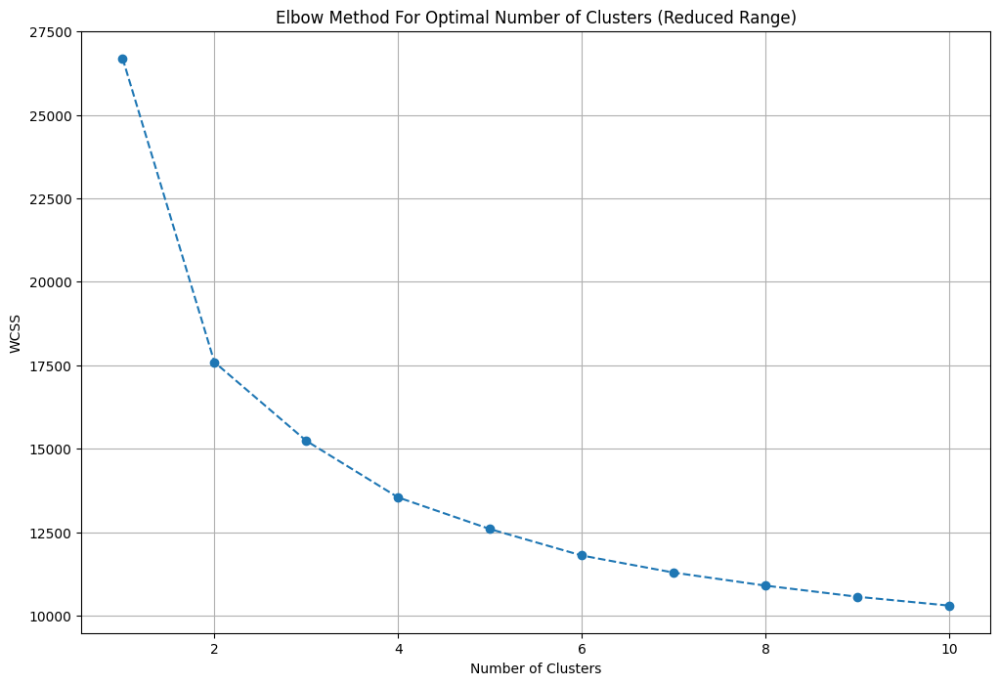

In [160]:
# Plot the results
plt.figure(figsize=(12, 8))
plt.plot(range(1,11), wcss_reduced, marker='o', linestyle='--')
plt.title('Elbow Method For Optimal Number of Clusters (Reduced Range)')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

In [161]:
# Define the weights for each feature as provided
# Assigning weights based on perceived luxury contribution
weights = {
    '24/7 Power Backup': 8,
    '24/7 Water Supply': 4,
    '24x7 Security': 7,
    'ATM': 4,
    'Aerobics Centre': 6,
    'Airy Rooms': 8,
    'Amphitheatre': 7,
    'Badminton Court': 7,
    'Banquet Hall': 8,
    'Bar/Chill-Out Lounge': 9,
    'Barbecue': 7,
    'Basketball Court': 7,
    'Billiards': 7,
    'Bowling Alley': 8,
    'Business Lounge': 9,
    'CCTV Camera Security': 8,
    'Cafeteria': 6,
    'Car Parking': 6,
    'Card Room': 6,
    'Centrally Air Conditioned': 9,
    'Changing Area': 6,
    "Children's Play Area": 7,
    'Cigar Lounge': 9,
    'Clinic': 5,
    'Club House': 9,
    'Concierge Service': 9,
    'Conference room': 8,
    'Creche/Day care': 7,
    'Cricket Pitch': 7,
    'Doctor on Call': 6,
    'Earthquake Resistant': 5,
    'Entrance Lobby': 7,
    'False Ceiling Lighting': 6,
    'Feng Shui / Vaastu Compliant': 5,
    'Fire Fighting Systems': 8,
    'Fitness Centre / GYM': 8,
    'Flower Garden': 7,
    'Food Court': 6,
    'Foosball': 5,
    'Football': 7,
    'Fountain': 7,
    'Gated Community': 7,
    'Golf Course': 10,
    'Grocery Shop': 6,
    'Gymnasium': 8,
    'High Ceiling Height': 8,
    'High Speed Elevators': 8,
    'Infinity Pool': 9,
    'Intercom Facility': 7,
    'Internal Street Lights': 6,
    'Internet/wi-fi connectivity': 7,
    'Jacuzzi': 9,
    'Jogging Track': 7,
    'Landscape Garden': 8,
    'Laundry': 6,
    'Lawn Tennis Court': 8,
    'Library': 8,
    'Lounge': 8,
    'Low Density Society': 7,
    'Maintenance Staff': 6,
    'Manicured Garden': 7,
    'Medical Centre': 5,
    'Milk Booth': 4,
    'Mini Theatre': 9,
    'Multipurpose Court': 7,
    'Multipurpose Hall': 7,
    'Natural Light': 8,
    'Natural Pond': 7,
    'Park': 8,
    'Party Lawn': 8,
    'Piped Gas': 7,
    'Pool Table': 7,
    'Power Back up Lift': 8,
    'Private Garden / Terrace': 9,
    'Property Staff': 7,
    'RO System': 7,
    'Rain Water Harvesting': 7,
    'Reading Lounge': 8,
    'Restaurant': 8,
    'Salon': 8,
    'Sauna': 9,
    'Security / Fire Alarm': 9,
    'Security Personnel': 9,
    'Separate entry for servant room': 8,
    'Sewage Treatment Plant': 6,
    'Shopping Centre': 7,
    'Skating Rink': 7,
    'Solar Lighting': 6,
    'Solar Water Heating': 7,
    'Spa': 9,
    'Spacious Interiors': 9,
    'Squash Court': 8,
    'Steam Room': 9,
    'Sun Deck': 8,
    'Swimming Pool': 8,
    'Temple': 5,
    'Theatre': 9,
    'Toddler Pool': 7,
    'Valet Parking': 9,
    'Video Door Security': 9,
    'Visitor Parking': 7,
    'Water Softener Plant': 7,
    'Water Storage': 7,
    'Water purifier': 7,
    'Yoga/Meditation Area': 7
}
# Calculate luxury score for each row
luxury_score = features_binary_df[list(weights.keys())].multiply(list(weights.values())).sum(axis=1)

In [163]:
temp_df['luxury_score'] = luxury_score

In [164]:
temp_df.sample(5)

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,additionalRoom,floorNum,facing,agePossession,nearbyLocations,furnishDetails,features,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,features_list,luxury_score
1542,flat,mahindra aura,sector 110,1.40,9655.0,1450.0,Super Built up area 1615(150.04 sq.m.)Built Up area: 1550 sq.ft. (144 sq.m.)Carpet area: 1450 sq.ft. (134.71 sq.m.),3,3,3,not available,10.0,North,Relatively New,"['Global Foyer Mall, Palam Vihar', 'Dwarka Expy, Block D, New Palam Vihar', 'Red Roses Public School', 'The NorthCap University', 'Park Hospital, Palam Vihar', 'Indira Gandhi Intl Airport']","['3 Wardrobe', '5 Fan', '1 Exhaust Fan', '3 Geyser', '15 Light', '1 Modular Kitchen', '1 Chimney', 'No AC', 'No Bed', 'No Curtains', 'No Dining Table', 'No Microwave', 'No Fridge', 'No Sofa', 'No Stove', 'No TV', 'No Washing Machine', 'No Water Purifier']","['Water purifier', 'Security / Fire Alarm', 'Feng Shui / Vaastu Compliant', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'Water Storage', 'No open drainage around', 'Bank Attached Property', 'Piped-gas', 'Internet/wi-fi connectivity', 'Recently Renovated', 'Visitor Parking', 'Swimming Pool', 'Park', 'Security Personnel', 'Natural Light', 'Airy Rooms', 'Spacious Interiors', 'Low Density Society', 'Waste Disposal', 'Rain Water Harvesting', 'Water softening plant', 'Shopping Centre', 'Fitness Centre / GYM', 'Club house / Community Center']",1615.0,1550.0,1450.00,0,0,0,0,0,0,"[Water purifier, Security / Fire Alarm, Feng Shui / Vaastu Compliant, Intercom Facility, Lift(s), High Ceiling Height, Maintenance Staff, Water Storage, No open drainage around, Bank Attached Property, Piped-gas, Internet/wi-fi connectivity, Recently Renovated, Visitor Parking, Swimming Pool, Park, Security Personnel, Natural Light, Airy Rooms, Spacious Interiors, Low Density Society, Waste Disposal, Rain Water Harvesting, Water softening plant, Shopping Centre, Fitness Centre / GYM, Club house / Community Center]",142
1268,flat,mapsko paradise,sector 83,0.95,6300.0,1508.0,Carpet area: 1340 (124.49 sq.m.),3,3,3,not available,1.0,NaN,Moderately Old,"['Reliance MART, Iris Broadway', 'NH – 8', 'Circle 3 / Sector 83', 'Bachpan Play School', 'Knowledge Tree World School', 'Discovery Montessori Preschool', 'iGrow Montessori', 'Sri Chaitanya School', 'IGI Airport', 'Kotak Mahindra Bank, Sec 83', 'SBI Sikandarpur Badha', 'Allahabad Bank, Sikandarpur Badha', 'HDFC Bank, Sikandarpur Bada', 'M3M SCO Shop cum Office', 'Shiv Shakti Petro, Sec-82']",NaN,NaN,NaN,NaN,1340.00,0,0,0,0,0,1,[],0
418,flat,raheja vedaanta,sector 108,1.50,5263.0,2850.0,Built Up area: 2850 (264.77 sq.m.),3,4,0,not available,12.0,NaN,Undefined,NaN,NaN,NaN,NaN,2850.0,NaN,0,0,0,0,0,1,[],0
1656,flat,bestech park view spa next,sector 67,3.32,12599.0,2635.0,Super Built up area 2635(244.8 sq.m.),4,5,3,servant room,12.0,West,Moderately Old,"['Omaxe City Centre Mall', 'Golf Course Extension Road', ""St. Xavier's School"", 'KIIT College of Engineering', 'Ektaa Hospital', 'Indira Gandhi International Airport', 'Surajgarh Gurgaon', 'Duke Horse Riding Club', 'Radisson Hotel Gurugram', 'SkyJumper Trampoline Park', 'HUDA Mini Golf Course', 'PVR Drive In Theater']","['4 Wardrobe', '8 Fan', '1 Exhaust Fan', '5 Geyser', '1 Stove', '10 Light', '6 AC', '1 Curtains', '1 Chimney', '1 Modular Kitchen', 'No Bed', 'No Dining Table', 'No Microwave', 'No Fridge', 'No Sofa', 'No TV', 'No Washing Machine', 'No Water Purifier']","['Centrally Air Conditioned', 'Water purifier', 'Security / Fire Alarm', 'Power Back-up', 'Feng Shui / Vaastu Compliant', 'Private Garden / Terrace', 'Intercom Facility', 'Lift(s)', 'High Ceiling Height', 'Maintenance Staff', 'False Ceiling Lighting', 'Water Storage', 'Separate entry for servant room', 'No open drainage around', 'Piped-gas', 'Internet/wi-fi connectivity', 'Recently Renovated', 'Visitor P

In [165]:
# cols to drop -> nearbyLocations,furnishDetails, features,features_list, additionalRoom
temp_df.drop(columns=['nearbyLocations','furnishDetails','features','features_list','additionalRoom'], inplace=True)

In [166]:
temp_df.sample(5)

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
603,flat,emaar gurgaon greens,sector 102,1.45,8787.0,1650.0,Super Built up area 1650(153.29 sq.m.),3,3,2,7.0,South-West,Relatively New,1650.0,NaN,NaN,0,1,0,0,0,0,169
305,house,spaze privy,sector 72,3.10,8486.0,3653.0,Plot area 3653(339.37 sq.m.),5,5,3,21.0,NaN,Relatively New,NaN,NaN,NaN,0,0,0,0,0,1,0
1284,house,independent,sector 25,10.00,37037.0,2700.0,Plot area 300(250.84 sq.m.),5,6,3,3.0,North,Old Property,NaN,NaN,NaN,0,1,1,0,0,0,64
3379,flat,smart world orchard,sector 61,1.60,13913.0,1150.0,Carpet area: 1150 (106.84 sq.m.),2,2,2,3.0,NaN,Undefined,NaN,NaN,1150.0,1,0,0,0,0,1,37
1593,flat,godrej nature plus serenity,sector 33,1.45,8677.0,1671.0,Super Built up area 1671(155.24 sq.m.),3,2,3,3.0,South,Undefined,1671.0,NaN,NaN,0,0,0,0,0,1,49


In [167]:
temp_df.shape

(3805, 23)

In [168]:
temp_df.to_csv('gurgaon_properties_cleaned_phase2.csv', index=False)

In [169]:
pd.read_csv("gurgaon_properties_cleaned_phase2.csv")

,property_type,society,sector,price,price_per_sqft,area,areaWithType,bedRoom,bathroom,balcony,floorNum,facing,agePossession,super_built_up_area,built_up_area,carpet_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score
0,flat,shree vardhman flora,sector 90,0.96,5120.0,1875.0,Super Built up area 1875(174.19 sq.m.),3,4,3,3.0,North,New Property,1875.00,NaN,NaN,0,1,0,0,0,1,106
1,flat,dlf new town heights,sector 90,1.30,6735.0,1930.0,Super Built up area 1930(179.3 sq.m.)Built Up area: 1929 sq.ft. (179.21 sq.m.)Carpet area: 1928 sq.ft. (179.12 sq.m.),3,3,3,10.0,South,Relatively New,1930.00,1929.000000,1928.000000,0,1,0,1,0,0,129
2,flat,sare crescent parc royal greens phase 1,sector 92,1.25,5832.0,2143.0,Super Built up area 2143(199.09 sq.m.),4,4,3,20.0,East,Relatively New,2143.00,NaN,NaN,0,1,0,0,0,1,60
3,house,palam vihar extension west zone rwa,sector 2,0.35,6481.0,540.0,Plot area 600(55.74 sq.m.)Carpet area: 540 sq.ft. (50.17 sq.m.),2,2,0,1.0,North-East,New Property,NaN,NaN,540.000000,0,0,0,0,0,1,0
4,flat,sare homes,sector 92,0.68,5238.0,1298.0,Carpet area: 1298 (120.59 sq.m.),3,3,2,11.0,North-West,Relatively New,NaN,NaN,1298.000000,0,0,0,1,0,1,100
5,house,rk excelo,sector 12,0.60,120000.0,50.0,Plot area 50(4.65 sq.m.)Built Up area: 30 sq.ft. (2.79 sq.m.)Carpet area: 15 sq.ft. (1.39 sq.m.),5,3,2,3.0,North,Moderately Old,NaN,30.000000,15.000000,0,0,0,0,1,1,0
6,flat,m3m skywalk,sector 74,1.48,12333.0,1200.0,Super Built up area 1400(130.06 sq.m.)Built Up area: 1300 sq.ft. (120.77 sq.m.)Carpet area: 1200 sq.ft. (111.48 sq.m.),2,2,3,13.0,North-East,Relatively New,1400.00,1300.000000,1200.000000,0,0,1,0,0,1,158
7,flat,shree vardhman flora,sector 90,1.25,4854.0,2575.0,Super Built up area 2575(239.23 sq.m.),4,5,2,8.0,South,Relatively New,2575.00,NaN,NaN,1,1,0,0,0,1,165
8,flat,godrej nature plus,sector 33,1.35,8231.0,1640.0,Super Built up area 1640(152.36 sq.m.),3,2,3,7.0,North-East,Undefined,1640.00,NaN,NaN,0,0,0,1,0,1,49
9,flat,emaar mgf the palm drive,sector 66,3.50,15901.0,2201.0,Super Built up area 2201(204.48 sq.m.)Built Up area: 2200 sq.ft. (204.39 sq.m.)Carpet area: 1800 sq.ft. (167.23 sq.m.),3,3,2,4.0,South,Relatively New,2201.00,2200.000000,1800.000000,1,0,0,0,0,1,89
